Gerar um modelo de detecção de objeto customizado para detectar as seguintes classes:

**['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']** using YoloV8.


# **1. Importando bibliotecas**
- `os` e `glob` para acessar diretórios de arquivos
- `numpy` para operações com arrays
- `pandas` para dataframes, criação de metadados
- `PIL` e `cv2` para operações e visualização de imagens
- `matplotlib` para plotar resultados e distribuições de classes

In [1]:
#!pip install PyQT6
#!pip install ultralytics

In [2]:
%gui qt

%matplotlib inline
import os, glob
import tqdm
import numpy as np
import pandas as pd
from PIL import Image
import cv2
import sys
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PyQt6.QtWidgets import *
from PyQt6.QtGui import *
from PyQt6.QtCore import *
import warnings
warnings.filterwarnings('ignore')

Todos os caminhos de diretórios são definidos no início do código para facilitar a manutenção e reutilização do código.

In [3]:
# Data path
data_path = 'datasets/css_data'
# Train, Valid and Test path
train_path = os.path.join(data_path, 'train')
valid_path = os.path.join(data_path, 'valid')
test_path = os.path.join(data_path, 'test')
# For saving results
output_path = '/kaggle/working'
# We can access both images and labels
folders = ['images', 'labels']
print("Data Path: {}\nTrain Path: {}\nValid Path: {}\nTest Path: {}\nOutput Path: {}".format(data_path, train_path, valid_path, test_path, output_path))

Data Path: datasets/css_data
Train Path: datasets/css_data\train
Valid Path: datasets/css_data\valid
Test Path: datasets/css_data\test
Output Path: /kaggle/working


Metadata - Vamos criar um arquivo csv contendo todas as informações sobre as imagens, como caminho, largura, altura, classe, etc. Isso facilitará a leitura e a manipulação dos dados.

In [4]:
# Initialize dictionaries of training and classes
train_dict = dict(train=0, valid=1, test=2)
path_dict = [train_path, valid_path, test_path]
class_names = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']
class_dict = dict(zip(range(len(class_names)), class_names))
print(class_dict)

{0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}


In [5]:
## Obter informações de nomes de arquivos e rótulos
# Ordenar os nomes dos arquivos para que os rótulos e as imagens fiquem na mesma ordem
# train_filenames = sorted(os.listdir(os.path.join(train_path, folders[0])))
# valid_filenames = sorted(os.listdir(os.path.join(valid_path, folders[0])))
# test_filenames = sorted(os.listdir(os.path.join(test_path, folders[0])))
# train_labels = sorted(os.listdir(os.path.join(train_path, folders[1])))
# valid_labels = sorted(os.listdir(os.path.join(valid_path, folders[1])))
# test_labels = sorted(os.listdir(os.path.join(test_path, folders[1])))

#Versão reduzida com list comprehension
train_filenames, valid_filenames, test_filenames = [sorted(os.listdir(os.path.join(path_dict[i], folders[0]))) for i in range(len(path_dict))]
train_labels, valid_labels, test_labels = [sorted(os.listdir(os.path.join(path_dict[i], folders[1]))) for i in range(len(path_dict))]

 ## ⬜ Verifique estas coisas
1. O comprimento dos **nomes de arquivos de treinamento/validação/teste** é o mesmo que o dos **rótulos de treinamento/validação/teste**

2. A ordem dos **nomes de arquivos de treinamento/validação/teste** é a mesma que a dos **rótulos de treinamento/validação/teste**

3. Vazamento de arquivos e entradas duplicadas nos **nomes de arquivos de treinamento/validação/teste**

### ✅ Verificar comprimentos

In [6]:
# Return lengths of all filenames
print("Total Train Files: {}\nTotal Valid Files: {}\nTotal Test Files:{}".format(len(train_filenames), len(valid_filenames), len(test_filenames)))

Total Train Files: 2605
Total Valid Files: 114
Total Test Files:82


In [7]:
# Check whether filenames and labels are of same length
len(train_filenames)==len(train_labels), len(valid_filenames)==len(valid_labels), len(test_filenames)==len(test_labels)

(True, True, True)

 ### ✅ Verificar Ordem
Vamos verificar a ordem dos nomes de arquivos e rótulos para garantir que cada imagem tenha o mesmo nome de anotação de rótulo que a imagem correspondente. Isso garantirá que não estamos usando informações de anotações e rótulos para uma imagem diferente.

In [8]:
# Check order in filenames and labels in all splits
[item.split('.')[0] for item in train_filenames]==[item.split('.')[0] for item in train_labels],\
[item.split('.')[0] for item in valid_filenames]==[item.split('.')[0] for item in valid_labels],\
[item.split('.')[0] for item in test_filenames]==[item.split('.')[0] for item in test_labels]

(True, True, True)

### ✅ Check Leakage
Verificaremos se algum nome de arquivo está presente em mais de um conjunto. Isso é conhecido como vazamento em conjuntos de dados. Se alguns nomes de arquivos forem comuns em mais de um conjunto, como treinamento ou validação, o treinamento não será confiável.

Muitas vezes, grandes conjuntos de dados de diferentes competições têm anotadores manuais. Devemos sempre verificar essas três coisas antes de prosseguir com a EDA ou pré-processamento.

In [9]:
set(train_filenames).intersection(set(valid_filenames)),\
set(valid_filenames).intersection(set(test_filenames)),\
set(test_filenames).intersection(set(train_filenames))

(set(), set(), set())

In [10]:
df = pd.DataFrame()
df['filenames'] = train_filenames + valid_filenames + test_filenames
df['labelnames'] = train_labels + valid_labels + test_labels
df['train_id'] = [0]*len(train_filenames) + [1]*len(valid_filenames) + [2]*len(test_filenames)

In [11]:
df.head()

,filenames,labelnames,train_id
0,-1670-_png_jpg.rf.0463edb430019e01ec79eed27a63...,-1670-_png_jpg.rf.0463edb430019e01ec79eed27a63...,0
1,-1670-_png_jpg.rf.3cb172ea2c4165c19ae2dd498b38...,-1670-_png_jpg.rf.3cb172ea2c4165c19ae2dd498b38...,0
2,-1670-_png_jpg.rf.7da967f9aeaa62defc36543b9e60...,-1670-_png_jpg.rf.7da967f9aeaa62defc36543b9e60...,0
3,-1670-_png_jpg.rf.b42b26d784545ce1a033679674a4...,-1670-_png_jpg.rf.b42b26d784545ce1a033679674a4...,0
4,-1670-_png_jpg.rf.dd5cb0a4d6da02d34f1dc003fb4e...,-1670-_png_jpg.rf.dd5cb0a4d6da02d34f1dc003fb4e...,0


### ✅ Verificar entradas duplicadas

In [12]:
# No duplicate entries found
df.filenames.duplicated().value_counts()

filenames
False    2801
Name: count, dtype: int64

In [13]:
# Count of train valid and test sets
df.train_id.value_counts()

train_id
0    2605
1     114
2      82
Name: count, dtype: int64

<Axes: title={'center': 'Train-Val-Test Split'}, xlabel='train_id'>

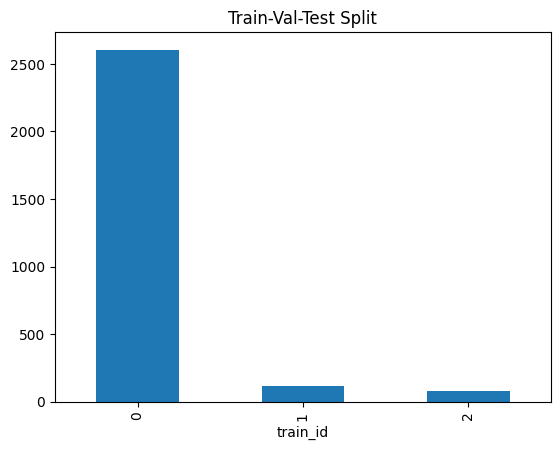

In [14]:
df.train_id.value_counts().plot(kind = 'bar', title = 'Train-Val-Test Split')

## Visualize Class Distribution
Neste conjunto de dados, cada imagem geralmente consiste em mais de uma anotação de classe. Portanto, precisamos verificar o número total de anotações em cada imagem para então visualizar uma distribuição geral das classes.

Existem três casos quando lemos o arquivo de anotação.

**1. O arquivo de anotação está vazio.**

`len(annotation)===0`
Vamos pular esses arquivos durante o treinamento e avaliação do nosso modelo de detecção de objetos.

**2. O arquivo de anotação possui apenas uma anotação.**

`len(annotation.shape)==1`
Vamos remodelar o array e obter as anotações.

**3. O arquivo de anotação possui várias anotações.**

`len(annotation)>1`
Vamos obter as anotações diretamente.

In [15]:
# Split list
train_keys = list(train_dict.keys())

In [16]:
# Complete path for annotation_files
annotation_files = (data_path + '/' + df.train_id.map(lambda x: train_keys[x]) + '/' + folders[1]
                    + '/' + df.labelnames).tolist()
t_id = df.train_id.tolist()
counts = []
invalid_idx = []
is_annotated = []
for idx, annotation_file in tqdm.tqdm(enumerate(annotation_files)):
    annotation = np.loadtxt(annotation_file)
    if len(annotation)==0:
        invalid_idx.append(idx)
        is_annotated.append(-1)
        counts.append([])
        continue
    if len(annotation.shape)==1:
        annotation = annotation.reshape(1, -1)
    counts.append(annotation[:,0].astype(int))
    is_annotated.append(1)
df['is_annotated'] = is_annotated

2801it [00:00, 6047.45it/s]


In [17]:
df.is_annotated.value_counts()

is_annotated
 1    2777
-1      24
Name: count, dtype: int64

In [18]:
# Create a count_dict which holds class counts per split (train/valid/test)
count_list = [np.unique(item, return_counts = True) for item in counts]
count_keys = [item[0] for item in count_list]
count_values = [item[1] for item in count_list]
count_dict = []
for ck,cv in zip(count_keys, count_values):
    count_dict.append(dict([(key,value) for key, value in zip(ck,cv)]))
df['count_dict'] = count_dict

In [19]:
from collections import Counter
train_count = df[df.train_id==0].count_dict.apply(lambda x: Counter(x)).sum()
valid_count = df[df.train_id==1].count_dict.apply(lambda x: Counter(x)).sum()
test_count = df[df.train_id==2].count_dict.apply(lambda x: Counter(x)).sum()

In [20]:
# We will normalize the counts to get a correct visualization, since there is huge difference
# between the counts of train valid and test splits
train_count = {key:value/sum(train_count.values()) for key, value in train_count.items()}
valid_count = {key:value/sum(valid_count.values()) for key, value in valid_count.items()}
test_count = {key:value/sum(test_count.values()) for key, value in test_count.items()}

In [21]:
print("Train Class Distribution Dict: {}\n\nValid Class Distribution Dict: {}\n\nTest Class Distribution Dict: {}"
     .format(train_count, valid_count, test_count))

Train Class Distribution Dict: {0: 0.08524190269684238, 1: 0.04474861092288928, 2: 0.06279983737633826, 3: 0.08394091340290012, 5: 0.2583547906220355, 4: 0.10738582463748475, 7: 0.0822062610109771, 8: 0.14221439219406423, 6: 0.09123187423770159, 9: 0.04187559289876677}

Valid Class Distribution Dict: {0: 0.1133428981348637, 3: 0.10616929698708752, 4: 0.15208034433285508, 5: 0.2381635581061693, 7: 0.058823529411764705, 2: 0.09899569583931134, 1: 0.03012912482065997, 6: 0.06312769010043041, 8: 0.07890961262553801, 9: 0.06025824964131994}

Test Class Distribution Dict: {0: 0.14473684210526316, 3: 0.10394736842105264, 4: 0.11842105263157894, 5: 0.22894736842105262, 6: 0.12105263157894737, 9: 0.05394736842105263, 2: 0.05394736842105263, 7: 0.08026315789473684, 8: 0.05789473684210526, 1: 0.03684210526315789}


In [22]:
df_count = pd.DataFrame()
df_count = pd.DataFrame({'train':train_count, 'valid': valid_count, 'test': test_count}).sort_index()

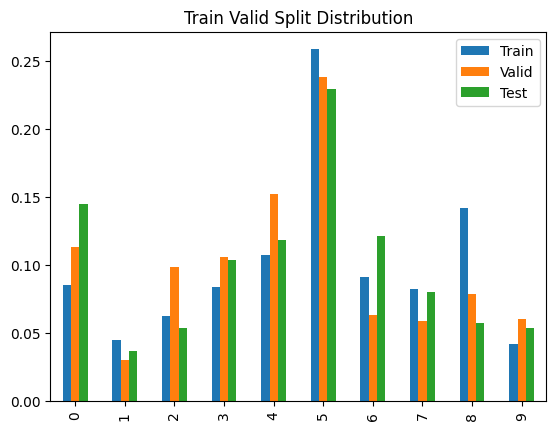

In [23]:
df_count['idx'] = pd.Series(df_count.index)
df_count.plot(y = ['train', 'valid', 'test'], kind = 'bar', title = 'Train Valid Split Distribution')
plt.legend(['Train', 'Valid', 'Test'])

Podemos ver que as contagens normalizadas de todas as classes estão mais ou menos balanceadas, o que garantirá que não veremos algumas classes com mais frequência do que outras durante o treinamento, já que a distribuição é praticamente a mesma entre todas as classes (em todas as divisões).


# Visualizar Amostras

Vamos visualizar algumas amostras do conjunto de dados e suas anotações. Como temos todas as anotações no formato YoloV8, começaremos convertendo esses arquivos de anotações para coordenadas de caixas delimitadoras (bounding boxes).

O formato de anotação YoloV8 tem 5 entradas em cada linha do arquivo `.txt`:
- Rótulo da Classe (c)
- Centro da Caixa Delimitadora (Coordenada X)
- Centro da Caixa Delimitadora (Coordenada Y)
- Largura da Caixa Delimitadora (w)
- Altura da Caixa Delimitadora (h)

As coordenadas da caixa delimitadora podem ser calculadas a partir das últimas 4 entradas no arquivo de anotação.

In [24]:
def yolo_annotation_to_bbox(annotation, img_height, img_width):
    """
    Converts Yolo annotations to bounding box coordinates
    Input:
    annotation: str, annotation file in .txt format
    img_height: int, image height
    img_width: int, image width
    Output:
    class: list, List of labels in the image
    bbox_list: list, List of bounding boxes in an image
    """
    sh = annotation.shape
    if len(sh)==0:
        print("No bounding box found")
    if len(sh)==1:
        annotation = annotation.reshape(1, -1)
    num_bbox = len(annotation)
    bbox_list = []
    for idx in range(num_bbox):
        c_x, c_y, w, h = annotation[idx][1:]
        x1 = ((c_x - w/2)*img_width).astype(int)
        x2 = ((c_x + w/2)*img_width).astype(int)
        y1 = ((c_y - h/2)*img_height).astype(int)
        y2 = ((c_y + h/2)*img_height).astype(int)
        bbox_list.append([x1, y1, x2, y2])
    return bbox_list

In [25]:
### invalid_files = (data_path + '/' + df.train_id[invalid_idx].apply(lambda x: train_keys[x]) + '/' + folders[0] + '/' + df.filenames[invalid_idx])
invalid_files = df.filenames[invalid_idx]
def visualize_samples(mode = 'train', n_samples = 12):
    """
    Plots 'n_samples' plots from train/valid/test split
    Input:
    mode: 'str' can take values from 'train'/'valid','test'
    n_samples: 'int'
    """
    # We will visualize only those files which have annotations 
    indices = df[(~df.filenames.isin(invalid_files))&(df.train_id==1)].sample(n_samples).index
    filenames = (data_path + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + folders[0] + '/' + df.filenames[indices]).tolist()
    annotations = (data_path + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + folders[1] + '/' + df.labelnames[indices]).tolist()
    plt.figure(figsize = (21, 11))
    plt.title('{} Set Samples'.format(mode.upper()))
    for idx in range(len(filenames)):
        image = np.array(Image.open(filenames[idx]))
        height, width, _ = image.shape 
        annotation = np.loadtxt(annotations[idx])
        bbox_list = yolo_annotation_to_bbox(annotation, height, width)
        if len(annotation.shape)==1:
            annotation = annotation.reshape(1, -1)
        labels = [class_dict[item] for item in annotation[:,0].astype(int)]
        plt.subplot(3, 4, idx + 1)
        for label, bbox in zip(labels, bbox_list):
            x1, y1, x2, y2 = bbox
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        plt.imshow(image)
    plt.tight_layout()
    plt.show()

### Exemplo de visualização de uma imagem com anotações

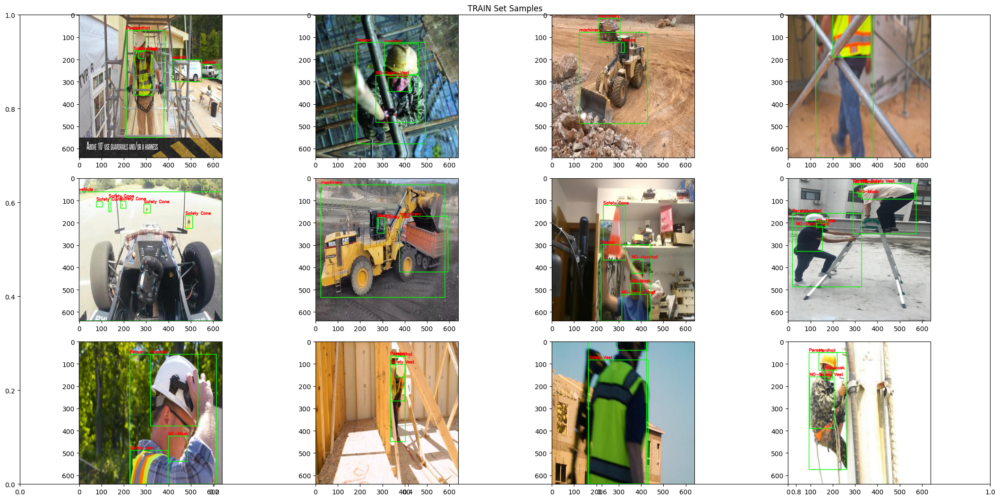

In [26]:
visualize_samples(mode = 'train', n_samples = 12)

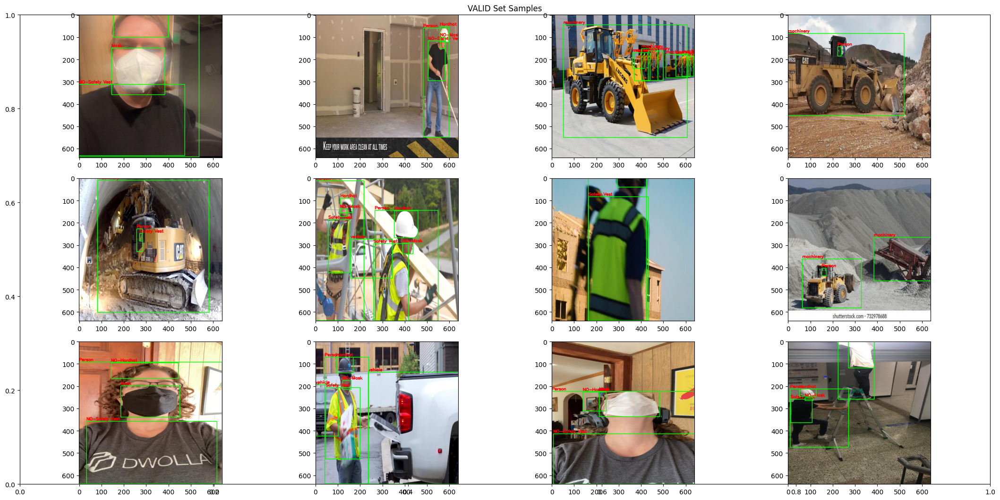

In [27]:
visualize_samples(mode = 'valid', n_samples = 12)

# 🧑‍💻 👓Run Custom Object Detection Model
Após a visualização do conjunto de dados, é hora de treinar nossa detecção de objetos personalizada. Usaremos YoloV8 para treinar nosso modelo de detecção de objetos personalizado.


## Create YAML file
Criaremos um arquivo YAML que será usado pelo CLI do YoloV8 para obter informações. Ele menciona os diretórios `train`, `valid`, `test` e o `nc` (número de classes) para treinar o modelo.


In [28]:
# import yaml
# ppe_data = dict(train = train_path,
#                     val = valid_path,
#                     test = test_path,
#                    nc = len(class_names),
#                    names = class_names)
# with open('ppe_data.yaml', 'w') as output:
#     yaml.dump(ppe_data, output, default_flow_style = True)

## Train a custom model
Usaremos o comando da Interface de Linha de Comando (CLI) para treinar um modelo personalizado usando YoloV8. Os argumentos fornecidos dependem de nossas tarefas e treinamento. Treinaremos o modelo por 250 épocas em um modelo pré-treinado (nos dados COCO128) para nosso conjunto de dados de Detecção de EPI.


In [29]:
#Fazer isso com a lib do python
import torch

class TrainModel:
    def __init__(self, model_path):
        self.model = YOLO(model_path)
        self.results = None
    
    def train(self, data, epochs):
        # Continuar o treinamento se 'resume' for True
        results = self.model.train(data=data, epochs=epochs)
        return results
    
    def val(self):
        self.results = self.model.val()
        results = self.results
        return results
    
    def plot_results(self):
        if self.results is None:
            print("No results available to plot.")
        else:
            print("Results: ", self.results)
            if hasattr(self.results, 'plot'):
                self.results.plot()
                plt.show()
            else:
                print("The results object does not have a 'plot' method.")
    
    def export(self, format):
        success = self.model.export(format=format)
        return success

In [30]:
model_path = 'yolov8n.pt'
train_model = TrainModel(model_path)
#Apenas tirar o comentário quando for treinar
# results = train_model.train(data='ppe_data.yaml', epochs=100)


## Visualizar resultados

In [31]:
train_results_path = './runs/detect/train10/'
csv_results = train_results_path + 'results.csv'
image_results = train_results_path + '*.*'
df_results = pd.read_csv(csv_results)
df_results

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,461.634,1.38621,2.78254,1.48795,0.46420,0.37257,0.37594,0.17099,1.83897,2.47082,1.79964,0.000237,0.000237,0.000237
1,2,883.240,1.31338,1.85661,1.44980,0.47400,0.43200,0.40224,0.18904,1.82948,2.24024,1.86521,0.000470,0.000470,0.000470
2,3,1302.200,1.26330,1.70833,1.42088,0.57351,0.44380,0.47564,0.20842,1.94280,2.12454,1.92386,0.000698,0.000698,0.000698
3,4,1697.790,1.24679,1.60942,1.39600,0.67938,0.50003,0.54637,0.25548,1.79654,1.85642,1.82908,0.000693,0.000693,0.000693
4,5,2086.350,1.21034,1.53705,1.37154,0.60301,0.48496,0.51887,0.22347,1.93888,1.92125,1.98471,0.000686,0.000686,0.000686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,38116.500,0.76027,0.55197,1.04581,0.89157,0.72320,0.80100,0.50107,1.31342,0.78514,1.41549,0.000042,0.000042,0.000042
96,97,38503.500,0.75516,0.55007,1.04308,0.89037,0.73421,0.80955,0.50518,1.31511,0.77884,1.41976,0.000035,0.000035,0.000035
97,98,38889.600,0.74930,0.54274,1.04214,0.90300,0.72899,0.80863,0.50003,1.32405,0.77349,1.42527,0.000028,0.000028,0.000028
98,99,39275.700,0.74728,0.54150,1.04217,0.90803,0.72541,0.80561,0.50192,1.31916,0.77101,1.42376,0.000021,0.000021,0.000021


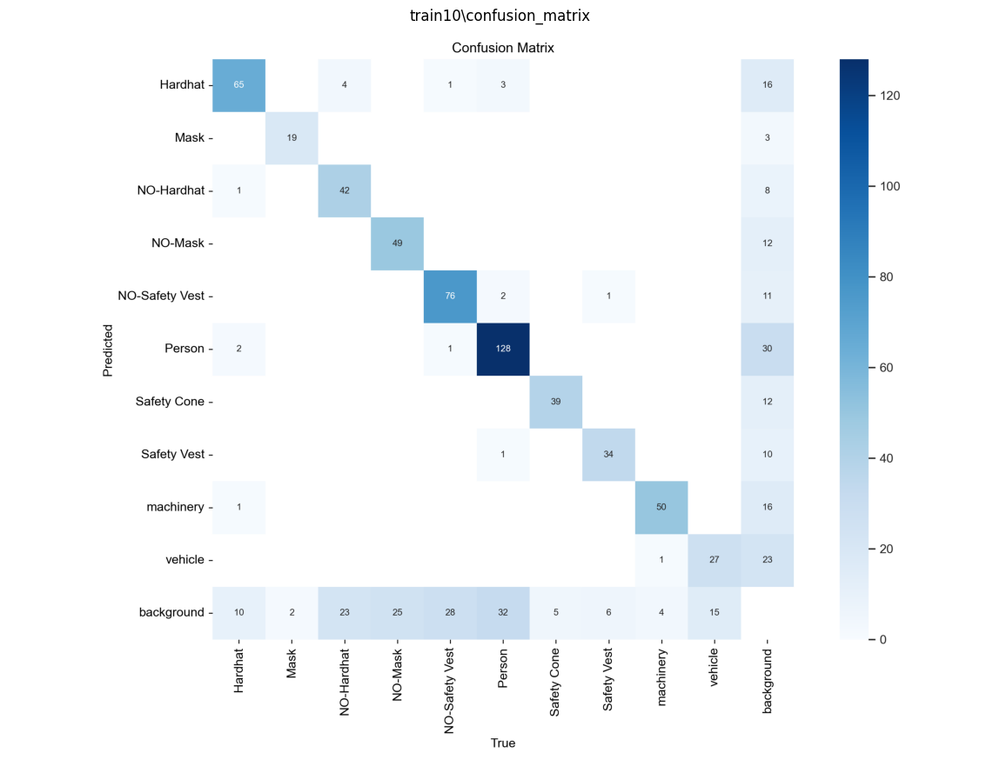

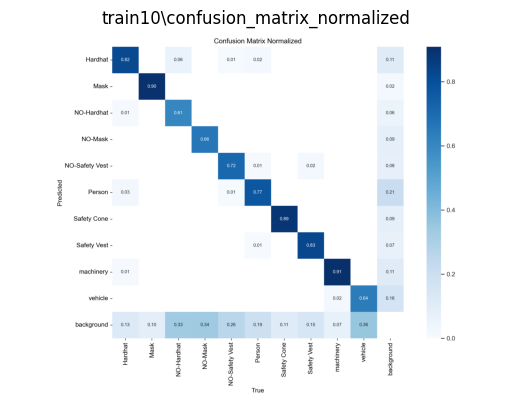

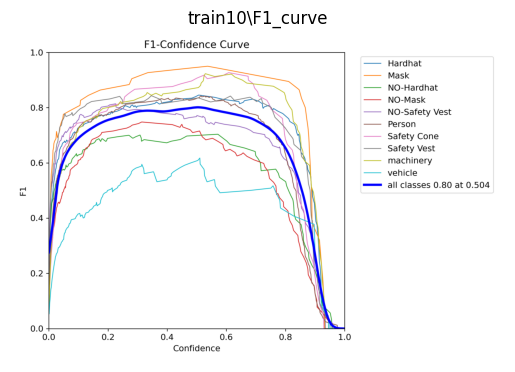

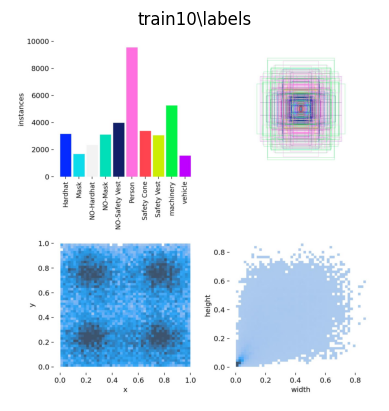

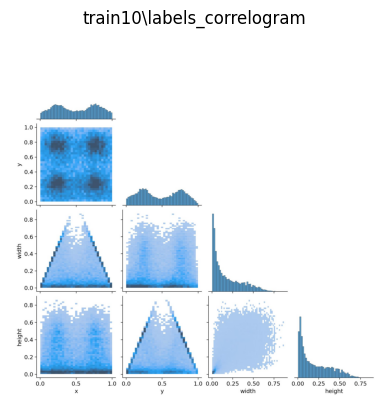

...

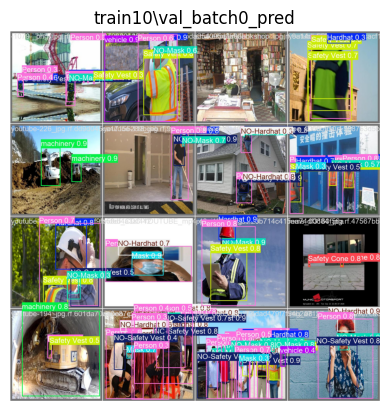

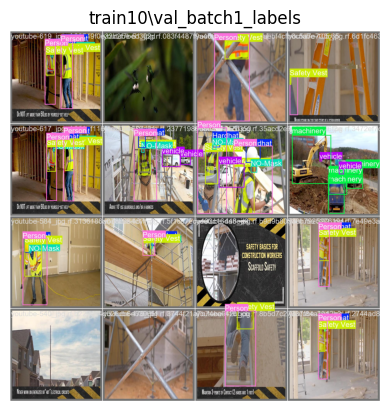

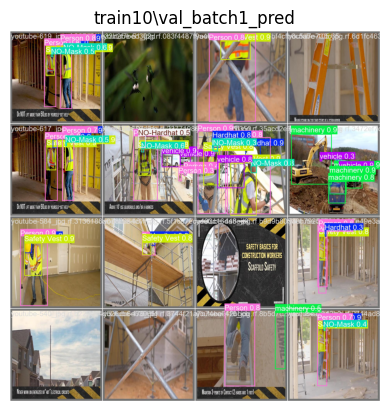

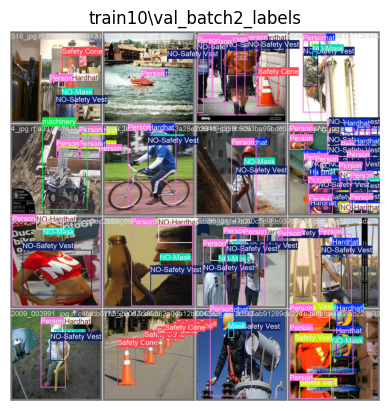

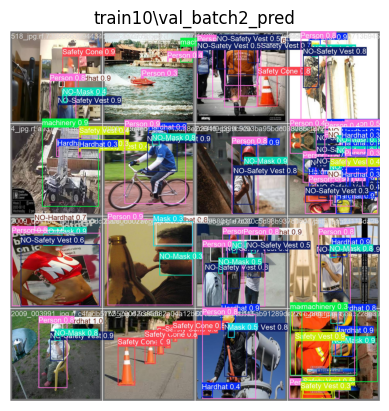

In [32]:
# Ajusta o tamanho da figura
plt.figure(figsize=(21, 11))

# Loop para carregar e exibir cada imagem
for result in glob.glob(image_results):
    ext = result.split('/')[-1].split('.')[-1]
    if ext in ['jpg', 'jpeg', 'png']:
        image = Image.open(result)
        image = np.array(image)
        plt.imshow(image)
        plt.title(result.split('/')[-1].split('.')[0])
        plt.axis('off')  # Remove os eixos
        plt.show()

In [33]:
class EPIApp(QWidget):
    def __init__(self):
        super().__init__()
        
        self.setWindowTitle("Verificação de EPIs")
        self.setGeometry(100, 100, 800, 600)

        # Modelo YOLO carregado
        best_model = best_model = train_results_path + '/weights/best.pt'


        self.model = YOLO(best_model)
        
        # Layout
        layout = QVBoxLayout()

        # Rótulo para exibir o feed da câmera
        self.label = QLabel(self)
        layout.addWidget(self.label)

        # Botão para verificar e "bater ponto"
        self.button = QPushButton("Verificar EPIs", self)
        self.button.clicked.connect(self.on_bater_ponto)
        layout.addWidget(self.button)

        # Definir o layout principal
        self.setLayout(layout)

        # Iniciar captura da câmera
        self.capture = cv2.VideoCapture(0)
        self.timer_id = self.startTimer(100)  # Atualizar a cada 100ms

    def timerEvent(self, event):
        # Atualizar o frame da câmera
        ret, frame = self.capture.read()
        if ret:
            frame_resized = cv2.resize(frame, (640, 480))
            
            # Detectar EPIs e desenhar as caixas delimitadoras
            frame_with_detections = self.detect_epi(frame_resized)

            # Converter imagem para formato RGB (PyQt usa RGB, OpenCV usa BGR)
            rgb_image = cv2.cvtColor(frame_with_detections, cv2.COLOR_BGR2RGB)
            height, width, channel = rgb_image.shape
            bytes_per_line = 3 * width
            qt_image = QImage(rgb_image.data, width, height, bytes_per_line, QImage.Format.Format_RGB888)
            
            # Exibir a imagem na interface
            self.label.setPixmap(QPixmap.fromImage(qt_image))

    def detect_epi(self, frame):
        # Realizar predição no frame capturado
        results = self.model(frame, verbose = False)

        # Iterar sobre cada detecção
        for result in results[0].boxes:
            # Extrair coordenadas da caixa delimitadora
            x1, y1, x2, y2 = map(int, result.xyxy[0])

            # Extrair o rótulo da classe
            label = self.model.names[int(result.cls[0])]

            # Escolher a cor da caixa: verde para EPIs e vermelho para itens como "NO-mask"
            if "NO-" in label:  # Ajuste baseado nos rótulos do modelo
                color = (0, 0, 255)  # Vermelho (BGR)
            else:
                color = (0, 255, 0)  # Verde (BGR)

            # Desenhar a caixa delimitadora no frame
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)

            # Adicionar o rótulo da classe acima da caixa delimitadora
            cv2.putText(frame, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

        return frame

    def on_bater_ponto(self):
        ret, frame = self.capture.read()
        if ret:
            # Verificar EPIs
            
            results = self.model(frame, verbose = False)
            
            print("Esses são os dados de results. Len:", len(results))
            
            print(results[0])
            
            if self.check_all_epis_present(results):
                self.show_logged_in_window()
            else:
                print("Esses são os dados de results. Len:", len(results))
            
                print(results[0])
                QMessageBox.critical(self, "Erro", "Faltam equipamentos de proteção!")

    def check_all_epis_present(self, results):
        # Defina as classes necessárias para permitir o login
        required_classes = {"Person", "hardhat", "mask", "safety vest"}
        
        # Classes detectadas no frame atual
        classes_detectadas = {self.model.names[int(result.cls[0].item())] for result in results[0].boxes}
        
        # Verifica se todas as classes necessárias estão presentes
        return required_classes.issubset(classes_detectadas)


    def show_logged_in_window(self):
        # Criar uma nova janela de "Logado"
        self.logged_in_window = QWidget()
        self.logged_in_window.setWindowTitle("Logado com Sucesso!")
        self.logged_in_window.setGeometry(300, 300, 400, 200)
        
        # Layout da nova janela
        layout = QVBoxLayout()
        label = QLabel("Logado com sucesso!", self.logged_in_window)
        layout.addWidget(label)
        
        self.logged_in_window.setLayout(layout)
        self.logged_in_window.show()  # Exibir a nova janela
        self.close()  # Fechar a janela atual

    def closeEvent(self, event):
        # Limpar a captura da câmera ao fechar a janela
        self.capture.release()
        cv2.destroyAllWindows()

In [34]:
if __name__ == "__main__":
    app = QApplication(sys.argv)
    window = EPIApp()
    window.show()
    sys.exit(app.exec())

Esses são os dados de results. Len: 1
ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}
obb: None
orig_img: array([[[197, 199, 199],
        [197, 199, 199],
        [197, 199, 199],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[197, 199, 199],
        [197, 199, 199],
        [197, 199, 199],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[198, 200, 200],
        [198, 200, 200],
        [198, 200, 200],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[253, 246, 243],
        [252, 245, 242],
        [251, 246, 242],
        ...,
        [120, 102, 102],
        [135, 119, 119